# AN2DL Second Challenge: 1st ACRE Cascade Competition

We have decided to approach the challenge analysing each dataset separately, so we have created a dictionary to get the directory of each dataset, composed of images and mask. 
This was, in some sense, mandatory. Indeed, after several attempts, we realized we did not have enough power and resources to train the models for each dataset all together in a single notebook.
So, the strategy to solve this problem was to train the models separately and then join them manually in a unique json file to get the final result.
The details of the passages, as you can see below, are presented as introduction to the relative paragraphs.

## Script preparation

### Libraries import


In [ ]:
# Primary libraries
import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
from PIL import Image
from datetime import datetime

In [ ]:
#Image plot
from matplotlib import cm
import matplotlib.pyplot as plt
from skimage.transform import resize

%matplotlib inline

In [ ]:
# Shortcut for Tensorflow
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import layers
from tensorflow.keras import backend as K
from functools import partial

### Drive import


Choose the directory in which you have the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
directory = "/content/drive/MyDrive/Secondo Assignment"

Mounted at /content/drive


In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### Dataset Directory

In [ ]:
def initialize_data_dir():
  
    data_dir = {
        "training" : {
            "bipbip"   : {
                "haricot" : {"images" : os.path.join(directory,"Training/Bipbip/Haricot/Images"),   "masks"  : os.path.join(directory,"Training/Bipbip/Haricot/Masks")},
                "mais"    : {"images" : os.path.join(directory,"Training/Bipbip/Mais/Images"),      "masks"  : os.path.join(directory,"Training/Bipbip/Mais/Masks")}
            },
            "pead"     : {
                "haricot" : {"images" : os.path.join(directory,"Training/Pead/Haricot/Images"),     "masks"  : os.path.join(directory,"Training/Pead/Haricot/Masks")},
                "mais"    : {"images" : os.path.join(directory,"Training/Pead/Mais/Images"),        "masks"  : os.path.join(directory,"Training/Pead/Mais/Masks")}
            },
            "roseau"   : {
                "haricot" : {"images" : os.path.join(directory,"Training/Roseau/Haricot/Images"),   "masks"  : os.path.join(directory,"Training/Roseau/Haricot/Masks")},
                "mais"    : {"images" : os.path.join(directory,"Training/Roseau/Mais/Images"),      "masks"  : os.path.join(directory,"Training/Roseau/Mais/Masks")}
            },
            "weedelec" : {
                "haricot" : {"images" : os.path.join(directory,"Training/Weedelec/Haricot/Images"), "masks"  : os.path.join(directory,"Training/Weedelec/Haricot/Masks")},
                "mais"    : {"images" : os.path.join(directory,"Training/Weedelec/Mais/Images"),    "masks"  : os.path.join(directory,"Training/Weedelec/Mais/Masks")}
            }
        }, 
        "test_dev" : {
            "bipbip"   : {
                "haricot" : {"images" : os.path.join(directory,"Test_Dev/Bipbip/Haricot/Images"),   "masks"  : None},
                "mais"    : {"images" : os.path.join(directory,"Test_Dev/Bipbip/Mais/Images"),      "masks"  : None}
            },
            "pead"     : {
                "haricot" : {"images" : os.path.join(directory,"Test_Dev/Pead/Haricot/Images"),     "masks"  : None},
                "mais"    : {"images" : os.path.join(directory,"Test_Dev/Pead/Mais/Images"),        "masks"  : None}
            },
            "roseau"   : {
                "haricot" : {"images" : os.path.join(directory,"Test_Dev/Roseau/Haricot/Images"),   "masks"  : None},
                "mais"    : {"images" : os.path.join(directory,"Test_Dev/Roseau/Mais/Images"),      "masks"  : None}
            },
           "weedelec" : {
                "haricot" : {"images" : os.path.join(directory,"Test_Dev/Weedelec/Haricot/Images"), "masks"  : None},
                "mais"    : {"images" : os.path.join(directory,"Test_Dev/Weedelec/Mais/Images"),    "masks"  : None}
           }
        } 
    }

    return data_dir


### Dictionary Structure

We have not preserved the initial image size in all the datasets: Roseau has images with different size, so we needed to resize all of them to the same size  (1216,816); Weedelec images are too big to train so we have decided to resize them to the size of Pead images (3280,2464); finally, Bipbip and Pead images were not resized.


In [ ]:
def initialize_parameters():
  
    parameters = {
        "SEED" : 123456,
        "split" : 0.17,
        "augmentation" : True,
        "img_w" : {"bipbip": 2048, "pead": 3280, "roseau": 1216, "weedelec": 3280},
        "img_h" : {"bipbip": 1536, "pead": 2464, "roseau":  816, "weedelec": 2464},
        "num_classes" : 3,
        "early_stop"  : True,
        "bs" : 1,
        "lr" : 1e-3
    }

    return parameters

In [ ]:
def initialize_info():
    
    data_dir = initialize_data_dir()
    parameters = initialize_parameters()

    info = {
        "data_dir"   : data_dir,
        "parameters" : parameters
    }

    return info

## Dataset

### Parameters creation


In [ ]:
def create_args_dictionary(par, team):

    # Augmentation Dictionary
    augm_dict = {
        "rotation_range" : 30,
        "width_shift_range" : 10,
        "height_shift_range" : 10,
        "zoom_range" : 0.3,
        "horizontal_flip" : True,
        "vertical_flip" : True,
        "fill_mode" : 'reflect',
    }

    # Flow Dictionary
    flow_dict = {
        "target_size": (par["img_h"][team], par["img_w"][team]),
        "batch_size" : par["bs"],
        "class_mode" : None, 
        "interpolation" : 'nearest',
        "seed" : par["SEED"]
    }

    return augm_dict, flow_dict

###Generator creation

In the ImageDataGenerator arguments we have added the brightness regulator, in order to treat images which were particularly dark.


In [ ]:
# Create training ImageDataGenerator object
def train_image_generator(augm_dict, apply_data_augmentation, val_split = 0.2):
    if apply_data_augmentation:
        train_img_data_gen  = ImageDataGenerator(**augm_dict, validation_split=val_split, brightness_range=[0.5,1.2], rescale = 1./255)
        train_mask_data_gen = ImageDataGenerator(**augm_dict, validation_split=val_split)
    else:
        train_img_data_gen  = ImageDataGenerator(validation_split=val_split, rescale=1./255)
        train_mask_data_gen = ImageDataGenerator(validation_split=val_split)
    return train_img_data_gen, train_mask_data_gen

# Create validation and test ImageDataGenerator objects
def valid_image_generator(val_split = 0.2):
    valid_img_data_gen  = ImageDataGenerator(validation_split=val_split, rescale=1./255)
    valid_mask_data_gen = ImageDataGenerator(validation_split=val_split)
    return valid_img_data_gen, valid_mask_data_gen 

def test_image_generator():
    test_img_data_gen  = ImageDataGenerator(rescale=1./255)
    return test_img_data_gen 

In [ ]:
def create_generators(data_dir, par, team = "bipbip", crop = "haricot"):
    
    augm_dict, flow_dict = create_args_dictionary(par, team)
    
    # Training
    training_dir = data_dir["training"][team][crop]
    train_img_data_gen, train_mask_data_gen = train_image_generator(augm_dict, par["augmentation"], par["split"])
    train_img_gen  =  train_img_data_gen.flow_from_directory(training_dir["images"], **flow_dict, subset = "training")  
    train_mask_gen = train_mask_data_gen.flow_from_directory(training_dir[ "masks"], **flow_dict, subset = "training")
    train_gen = zip(train_img_gen, train_mask_gen)

    # Validation
    valid_dev_dir = data_dir["training"][team][crop]
    valid_img_data_gen, valid_mask_data_gen = valid_image_generator(par["split"])
    valid_img_gen  =  valid_img_data_gen.flow_from_directory(valid_dev_dir["images"], **flow_dict, subset = "validation")
    valid_mask_gen = valid_mask_data_gen.flow_from_directory(valid_dev_dir[ "masks"], **flow_dict, subset = "validation")
    valid_gen = zip(valid_img_gen, valid_mask_gen)

    # Test
    test_dev_dir = data_dir["test_dev"][team][crop]
    test_data_gen = test_image_generator()
    test_gen  =  test_data_gen.flow_from_directory(test_dev_dir["images"], **flow_dict, shuffle = False)  

    # Dimension of Generators
    gen_dims = (len(train_img_gen), len(valid_img_gen), len(test_gen))

    return train_gen, valid_gen, test_gen, gen_dims

### Masks creation

In [ ]:
# Prepare target mask
def convert_masks(x_, y_):
    label_1 = tf.cast(tf.reduce_any(tf.math.equal(y_, [255, 255, 255]), axis=-1, keepdims=True), tf.float32)
    label_2 = tf.cast(tf.reduce_any(tf.math.equal(y_, [216,  67,  82]), axis=-1, keepdims=True), tf.float32)
    return x_, label_1 + 2 * label_2

### Dataset creation


In [ ]:
def create_dataset(data_dir, parameters, team = "bipbip", crop = "haricot"):
    
    # Create generators to read images from dataset directory
    train_gen, valid_gen, test_gen, gen_dims = create_generators(data_dir, parameters, team, crop)

    # Creating Dataset
    size = [None, parameters["img_h"][team], parameters["img_w"][team], 3]
    train_dataset = tf.data.Dataset.from_generator(lambda: train_gen, output_types=(tf.float32, tf.float32), output_shapes=(size,size))
    train_dataset = train_dataset.map(convert_masks)
    valid_dataset = tf.data.Dataset.from_generator(lambda: valid_gen, output_types=(tf.float32, tf.float32), output_shapes=(size,size))
    valid_dataset = valid_dataset.map(convert_masks)
    test_dataset  = tf.data.Dataset.from_generator(lambda:  test_gen, output_types=tf.float32, output_shapes=size)

    # Repeat
    train_dataset = train_dataset.repeat()
    valid_dataset = valid_dataset.repeat()
    
    
    return train_dataset, valid_dataset, test_dataset, gen_dims

### Plot of training images

In [ ]:
def show_test_images(augmented_img, target, mode = "train"):

    if mode == "train" or mode == "valid":
        fig, ax = plt.subplots(1, 2, figsize=(12, 8))
        augmented_img = augmented_img[0] 
        augmented_img = augmented_img * 255

        target = np.array(target[0, ..., 0])
        target_img = np.zeros([target.shape[0], target.shape[1], 3])

        target_img[np.where(target == 0)] = [  0,   0,   0]
        target_img[np.where(target == 1)] = [255, 255, 255]
        target_img[np.where(target == 2)] = [216,  67,  82]

        ax[0].imshow(np.uint8(augmented_img))
        ax[1].imshow(np.uint8(target_img))
        plt.show()

    elif mode == "test":
        fig, ax = plt.subplots(1, 1, figsize=(16, 12))
        augmented_img = augmented_img[0] 
        augmented_img = augmented_img * 255
        ax[0].imshow(np.uint8(augmented_img))
        plt.show()

def show_multiple_test_images(iterator, num  = 1, mode = "train", use = True):
  
    if use:
        print("\nVISUALIZATION OF SOME TRAINING IMAGES\n")
        for i in range(num):
            target = None
            if mode == "train": augmented_img = next(iterator)
            else: augmented_img, target = next(iterator)
            show_test_images(augmented_img, target, mode)


## Model

###Model creation

For all the datasets we have used a U-Net like architecture, in which the variable called “start_f” represents the initial number of filters. We have changed this number, passing it as a parameter, according to the whole dimension of the problem, i.e the number of hyperparameters. For Bipbip and Pead we set start_f = 32, for Roseau start_f = 16 and for Weedelec start_f = 8. 


In [ ]:
def conv_block(inputs, filters, pool=True):

    x = layers.Conv2D(filters, 3, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    x = layers.Conv2D(filters, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    if pool == True:
        p = layers.MaxPool2D((2, 2))(x)
        return x, p
    else:
        return x


def create_model(parameters, team, crop, depth, start_f, num_classes, pool=True):

    img_h, img_w = parameters["img_h"][team], parameters["img_w"][team]
    inputs = tf.keras.Input(shape=(img_h,img_w,3))

    """ Encoder """
    x1, p1 = conv_block(inputs, start_f, pool=True)
    x2, p2 = conv_block(p1, start_f*2, pool=True)
    x3, p3 = conv_block(p2, start_f*3, pool=True)
    x4, p4 = conv_block(p3, start_f*4, pool=True)

    """ Bridge """
    b1 = conv_block(p4, start_f*8 , pool=False)

    """ Decoder """
    u1 = layers.UpSampling2D((2, 2), interpolation="bilinear")(b1)
    c1 = layers.Concatenate()([u1, x4])
    x5 = conv_block(c1, start_f*4, pool=False)

    u2 = layers.UpSampling2D((2, 2), interpolation="bilinear")(x5)
    c2 = layers.Concatenate()([u2, x3])
    x6 = conv_block(c2, start_f*3, pool=False)

    u3 = layers.UpSampling2D((2, 2), interpolation="bilinear")(x6)
    c3 = layers.Concatenate()([u3, x2])
    x7 = conv_block(c3, start_f*2, pool=False)

    u4 = layers.UpSampling2D((2, 2), interpolation="bilinear")(x7)
    c4 = layers.Concatenate()([u4, x1])
    x8 = conv_block(c4, start_f, pool=False)

    """ Output layer """
    output = layers.Conv2D(num_classes, 1, padding="same", activation="softmax")(x8)

    model = tf.keras.Model(inputs, output)


    return model


### Model compiling

after some trials with various losses (Jaccard loss, boundary loss ), we have chosen SparseCategoricalCrossentropy because it gave us the best prediction.

In [ ]:
def meanIoU(y_true, y_pred):

    y_pred = tf.expand_dims(tf.argmax(y_pred, -1), -1)
    per_class_iou = []

    for i in range(1,2): 
      class_pred = tf.cast(tf.where(y_pred == i, 1, 0), tf.float32)
      class_true = tf.cast(tf.where(y_true == i, 1, 0), tf.float32)
      intersection = tf.reduce_sum(class_true * class_pred)
      union = tf.reduce_sum(class_true) + tf.reduce_sum(class_pred) - intersection
    
      iou = (intersection + 1e-7) / (union + 1e-7)
      per_class_iou.append(iou)

    return tf.reduce_mean(per_class_iou)

In [ ]:
def initialize_opt_par(parameters):
    
    # Optimization parameters
    loss = tf.keras.losses.SparseCategoricalCrossentropy() 
    optimizer = tf.keras.optimizers.Adam(learning_rate=parameters["lr"])
    metrics = ['accuracy', meanIoU]

    return loss, optimizer, metrics


### Model and Callbacks

In [ ]:
def initialize_model(parameters, team, crop, images):

    model = create_model(parameters, team, crop, depth=5, start_f=8, num_classes=3)
    loss, optimizer, metrics = initialize_opt_par(parameters)
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    
    if images: model.summary()

    return model

In [ ]:
 def initialize_callbacks(parameters, team, crop):

    callbacks = []
    now = datetime.now().strftime('%b%d_%H-%M-%S')
    model_name = 'SEGM'

    exps_dir = os.path.join(directory, 'segmentation_experiments')
    exps_dir = os.path.join(exps_dir, team)
    exps_dir = os.path.join(exps_dir, crop)
    if not os.path.exists(exps_dir): os.makedirs(exps_dir)
    exp_dir  = os.path.join(exps_dir ,  model_name + '_' + str(now))
    if not os.path.exists(exp_dir):  os.makedirs(exp_dir)
    ckpt_dir = os.path.join(exp_dir  , 'ckpts')
    if not os.path.exists(ckpt_dir): os.makedirs(ckpt_dir)
    best_dir = os.path.join(ckpt_dir , 'best')


    # Model checkpoint
    ckpt_callback = tf.keras.callbacks.ModelCheckpoint(filepath=best_dir, save_weights_only=True, save_best_only=True, verbose=2)
    callbacks.append(ckpt_callback)

    # Early Stopping
    if parameters["early_stop"]:
        es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=15)
        callbacks.append(es_callback)

    return callbacks, best_dir

## Evaluation


###Training graphics


In [ ]:
def training_graphics(history):

    print("\nTRAINING TABLE\n")
    frame = pd.DataFrame(history.history)
    print(frame)
    print("\nTRAINING GRAPHICS\n")
    acc_plot = frame.plot(y="meanIoU", title="meanIoU vs Epochs", legend=False)
    acc_plot.set(xlabel="Epochs", ylabel="meanIoU")

    acc_plot = frame.plot(y="loss", title = "Loss vs Epochs", legend=False)
    acc_plot.set(xlabel="Epochs", ylabel="Loss")

    fig = plt.figure(figsize=(12, 5))
    fig.add_subplot(122)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Regularised model: loss vs. epochs')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='upper right')
    plt.show()

### Validation Set

In [ ]:
def show_predict_images(out_sigmoid, augmented_img, target):
    
    fig, ax = plt.subplots(1, 6, figsize=(48, 12))
    
    augmented_img = augmented_img[0] 
    augmented_img = augmented_img * 255

    target = np.array(target[0, ..., 0])
    target_img = np.zeros([target.shape[0], target.shape[1], 3])

    target_img[np.where(target == 0)] = [  0,   0,   0]
    target_img[np.where(target == 1)] = [255, 255, 255]
    target_img[np.where(target == 2)] = [216,  67,  82]

    predicted_class = tf.argmax(out_sigmoid, -1)
    predicted_class = np.array(predicted_class[0, ...])

    predicted_img = np.zeros([target.shape[0], target.shape[1], 3])
    predicted_img[np.where(predicted_class == 0)] = [  0,   0,   0]
    predicted_img[np.where(predicted_class == 1)] = [255, 255, 255]
    predicted_img[np.where(predicted_class == 2)] = [216,  67,  82]

    error_img = np.zeros([target.shape[0], target.shape[1], 3])
    error_img[np.where(predicted_class == target)] = [  0, 255,   0]
    error_img[np.where(predicted_class != target)] = [255,   0,   0]
    
    crops_img = np.zeros([target.shape[0], target.shape[1], 3])
    crops_img[np.where(target == 1)] = [255,   0,   0]
    crops_img[np.where((target == 1) & (predicted_class == 1))]= [  0, 255,   0]

    weeds_img = np.zeros([target.shape[0], target.shape[1], 3])
    weeds_img[np.where(target == 2)] = [255,   0,   0]
    weeds_img[np.where((target == 2) & (predicted_class == 2))] = [  0, 255,   0]

    ax[0].imshow(np.uint8(augmented_img))
    ax[1].imshow(np.uint8(predicted_img))
    ax[2].imshow(np.uint8(target_img))
    ax[3].imshow(np.uint8(error_img)) #here we show the error of the prediction
    ax[4].imshow(np.uint8(crops_img)) #here we show the crops predicted well in green, the incorrect ones in red
    ax[5].imshow(np.uint8(weeds_img)) #here we show the weeds predicted well in green, the incorrect ones in red
    plt.show()


def show_multiple_predict_images(model, iterator, num = 1, use = True, all = False, gen_dims = 0):
    if use:
        print("\nVALIDATION SET PREDICTIONS\n")
        if all : num = gen_dims[1]
        for i in range(num):
            augmented_img, target = next(iterator)
            out_sigmoid = model.predict(x=augmented_img)
            show_predict_images(out_sigmoid, augmented_img, target)


### Test Set

In [ ]:
# Print test set predictions
def show_predict_test_images(out_sigmoid, augmented_img):
    
    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    
    augmented_img = augmented_img[0] 
    augmented_img = augmented_img * 255

    predicted_class = tf.argmax(out_sigmoid, -1)
    predicted_class = np.array(predicted_class[0, ...])
    predicted_img = np.zeros([augmented_img.shape[0], augmented_img.shape[1], 3])

    predicted_img[np.where(predicted_class == 0)] = [  0,   0,   0]
    predicted_img[np.where(predicted_class == 1)] = [255, 255, 255]
    predicted_img[np.where(predicted_class == 2)] = [216,  67,  82]

    ax[0].imshow(np.uint8(augmented_img))
    ax[1].imshow(np.uint8(predicted_img))
    plt.show()


def show_multiple_predict_test_images(model, iterator, num, use = True):
    if use:
        print("\nTEST SET PREDICTIONS\n")
        for i in range(num):
            augmented_img = next(iterator)
            out_sigmoid = model.predict(x=augmented_img)
            show_predict_test_images(out_sigmoid, augmented_img)


## Encoding Predictions

For what concern Roseau and Weedelec, we had to resize again the mask images predicted before the encoding. So we used nearest neighbor interpolation, which we have seen to preserve the image best. 

###Encode Image

In [ ]:
def rle_encode(img):

    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]

    return ' '.join(str(x) for x in runs)

In [ ]:
def encode_prediction(submission_dict, team, crop, model, iterator, image, img_name, count):

    # Create Mask  
    out_sigmoid = model.predict( x = image )
    mask_arr = tf.argmax(out_sigmoid, -1)
    mask_arr = np.array(mask_arr[0, ...])
    img_dim = submission_dict[img_name]['shape']
    if ( team == "roseau" or team == "weedelec"):
    # Create Mask Image
      predicted_img = np.zeros([mask_arr.shape[0], mask_arr.shape[1], 3], dtype=int)
      predicted_img[np.where(mask_arr == 0)] = [  0,   0,   0]
      predicted_img[np.where(mask_arr == 1)] = [255, 255, 255]
      predicted_img[np.where(mask_arr == 2)] = [216,  67,  82]

    # Resize the Mask Image
    
      img = Image.fromarray(np.uint8(predicted_img), 'RGB')
      img = img.resize((img_dim[1], img_dim[0]), resample=Image.NEAREST)
      img = np.array(img)
      if count < 3 : show_predict_resized_images(predicted_img, img)

    # Create the Resized Mask
      final_mask = np.zeros(img.shape[0:2], dtype=int)
      final_mask[np.where(np.all(img == [  0,   0,   0], axis = -1))] = 0
      final_mask[np.where(np.all(img == [255, 255, 255], axis = -1))] = 1
      final_mask[np.where(np.all(img == [216,  67,  82], axis = -1))] = 2

    # RLE encoding
      rle_encoded_crop = rle_encode(final_mask == 1)
      rle_encoded_weed = rle_encode(final_mask == 2)
      submission_dict[img_name]['segmentation']['crop'] = rle_encoded_crop
      submission_dict[img_name]['segmentation']['weed'] = rle_encoded_weed
    else:
      rle_encoded_crop = rle_encode(mask_arr == 1)
      rle_encoded_weed = rle_encode(mask_arr == 2)
      submission_dict[img_name]['segmentation']['crop'] = rle_encoded_crop
      submission_dict[img_name]['segmentation']['weed'] = rle_encoded_weed

    return submission_dict


In [ ]:
# Print test set predictions after the resizing
def show_predict_resized_images(small_img, big_img):
    
    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    ax[0].imshow(np.uint8(small_img))
    ax[1].imshow(np.uint8( big_img))
    plt.show()


###Encode Dataset

In [ ]:
def submit_prediction(submission_dict, data_dir, team, crop, model, iterator):

    enc_dir = data_dir["test_dev"][team][crop]["images"]
    enc_dir = os.path.join(enc_dir, "img")

    images_names = os.listdir(enc_dir)
    images_names.sort()

    count = 0
    for img_name in images_names:
        img_name = img_name[:-4]
        image = next(iterator)
        submission_dict = encode_prediction(submission_dict, team, crop, model, iterator, image, img_name, count)
        count += 1

    return submission_dict


In [ ]:
def create_subdict(data_dir):

    submission_dict = {}
    teams = ["bipbip", "pead", "roseau", "weedelec"]
    crops = ["haricot", "mais"]

    for team in teams:
       for crop in crops:
          img_dir = data_dir["test_dev"][team][crop]["images"]
          img_dir = os.path.join(img_dir, "img")
          images_names = os.listdir(img_dir)
          for img_name_ext in images_names:
              img_name = img_name_ext[:-4]
              submission_dict[img_name] = {}

              # Find Image Dimensions
              img_dim = None
              if team == "bipbip"   : img_dim = [1536,2048]
              if team == "pead"     : img_dim = [2464,3280]
              if team == "weedelec" : img_dim = [3456,5184]
              if team == "roseau"   :
                  im = Image.open(os.path.join(img_dir, img_name_ext))
                  img_dim = [im.size[1], im.size[0]]
           
              # Create Dictionary
              submission_dict[img_name]['shape'] = img_dim
              submission_dict[img_name][ 'team'] = team.capitalize()
              submission_dict[img_name][ 'crop'] = crop.capitalize()
              submission_dict[img_name]['segmentation'] = {}
              submission_dict[img_name]['segmentation']['crop'] = ""
              submission_dict[img_name]['segmentation']['weed'] = ""

    return submission_dict


###Create Json

In [ ]:
def create_json(submission_dict):

    now = datetime.now().strftime('%b%d_%H-%M-%S')

    sub_dir = os.path.join(directory, "submissions")
    if not os.path.exists(sub_dir): os.makedirs(sub_dir)

    file_name = "submission_" + str(now) + ".json"
    json_file = os.path.join(sub_dir, file_name)

    # Json pushing
    with open(json_file, 'a') as f:
        json.dump(submission_dict, f)

    print("Encoding Completato")
    print(f"File salvato come {file_name}")


## Training

Then we proceeded with the training in this way: to optimize the training time we have trained each team in different copies of the initial notebook and after that we have put together manually in the JSON file.

In [ ]:
def train(info, submission_dict, team, crop, epochs, images):

    print("\n--------------------------------------------------------------------------------------------------")
    print(f"START TRAINING OF {team.upper()} {crop.upper()}")
    print("--------------------------------------------------------------------------------------------------\n")

    train_dataset,  valid_dataset,  test_dataset, gen_dims = create_dataset(info["data_dir"], info["parameters"], team, crop)
    train_iterator, valid_iterator, test_iterator = iter(train_dataset), iter(valid_dataset), iter( test_dataset)
    show_multiple_test_images(train_iterator, num = 3, mode = "train", use = images)

    model = initialize_model(info["parameters"], team, crop, images)
    callbacks, best_dir = initialize_callbacks(info["parameters"], team, crop)

    print("\nSTART TRAINING\n")

    history = model.fit(x = train_dataset,
                        epochs = epochs,
                        steps_per_epoch  = gen_dims[0],
                        #steps_per_epoch  = 3,
                        validation_data  = valid_dataset,
                        validation_steps = gen_dims[1],
                        #validation_steps = 3,
                        callbacks = callbacks)
    model.load_weights(best_dir)

    if images: training_graphics(history)
    show_multiple_predict_images(model, valid_iterator, num = 3, use = images, all = True, gen_dims = gen_dims)
    show_multiple_predict_test_images(model, test_iterator, num = gen_dims[2], use = images)

    submission_dict = submit_prediction(submission_dict, info["data_dir"], team, crop, model, test_iterator)

    print("\n--------------------------------------------------------------------------------------------------")
    print(f"END TRAINING OF {team.upper()} {crop.upper()}")
    print("--------------------------------------------------------------------------------------------------\n")

    return submission_dict

Here we can see an example of training. In this case we are training the dataset Weedelec-mais:


--------------------------------------------------------------------------------------------------
START TRAINING OF WEEDELEC MAIS
--------------------------------------------------------------------------------------------------

Found 75 images belonging to 1 classes.
Found 75 images belonging to 1 classes.
Found 15 images belonging to 1 classes.
Found 15 images belonging to 1 classes.
Found 15 images belonging to 1 classes.

VISUALIZATION OF SOME TRAINING IMAGES



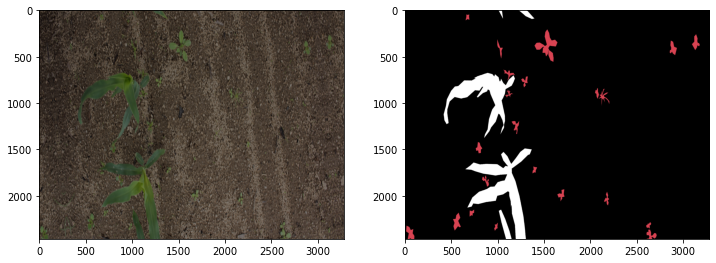

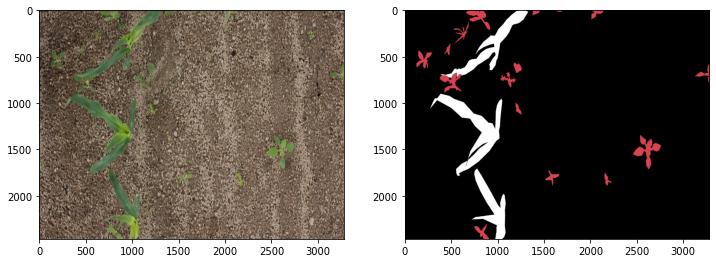

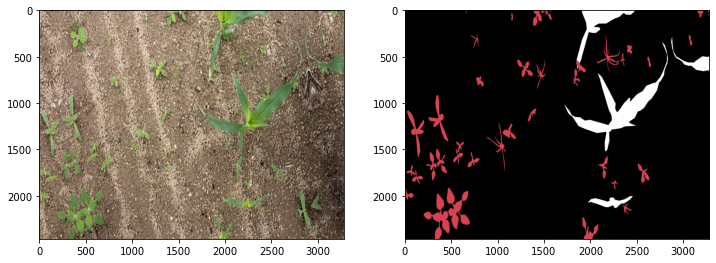

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 2464, 3280,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 2464, 3280, 8 224         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 2464, 3280, 8 32          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 2464, 3280, 8 0           batch_normalization[0][0]        
______________________________________________________________________________________________

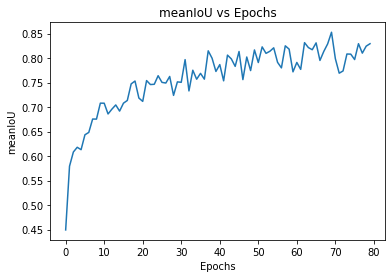

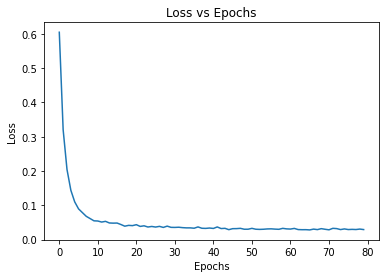

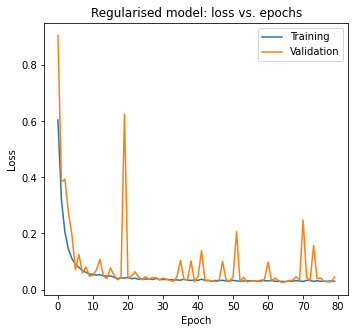


VALIDATION SET PREDICTIONS



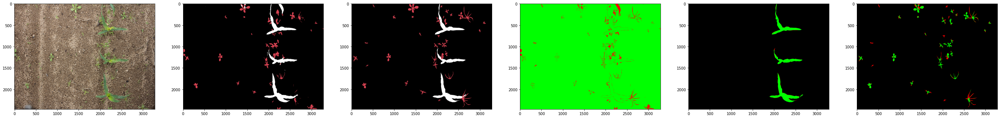

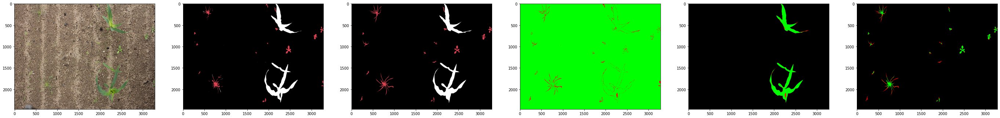

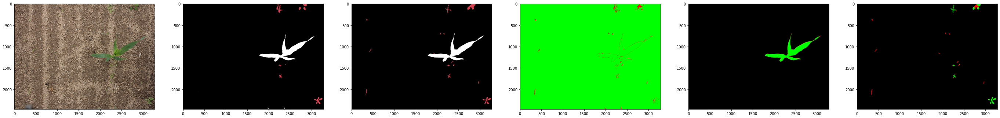

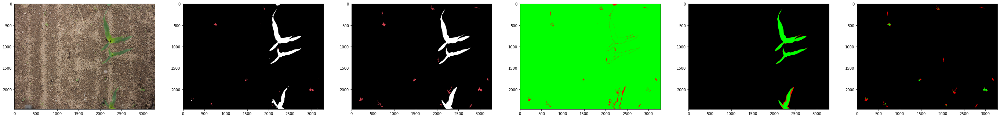

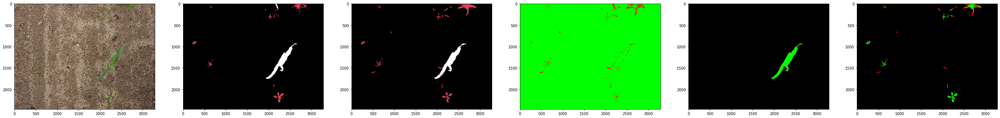

...

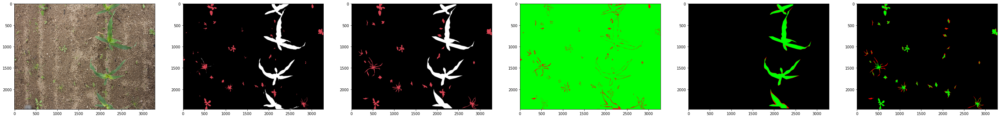

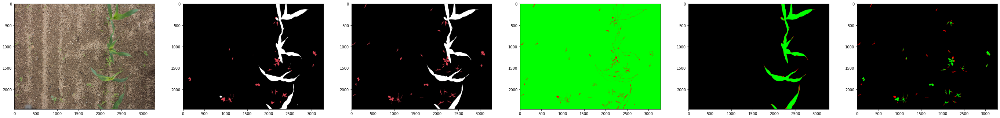

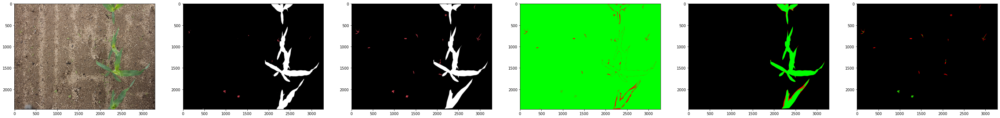

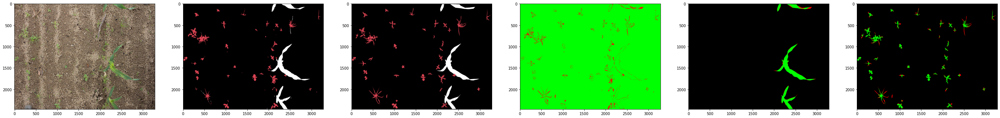

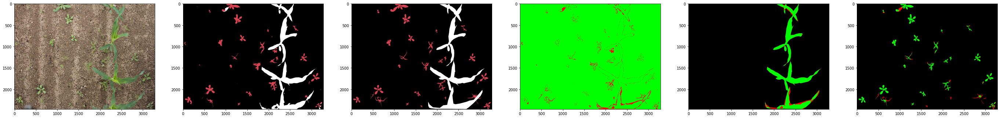


TEST SET PREDICTIONS



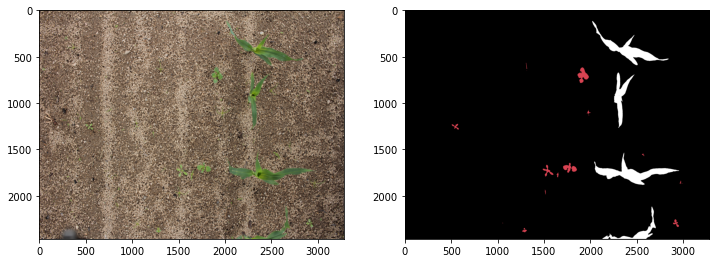

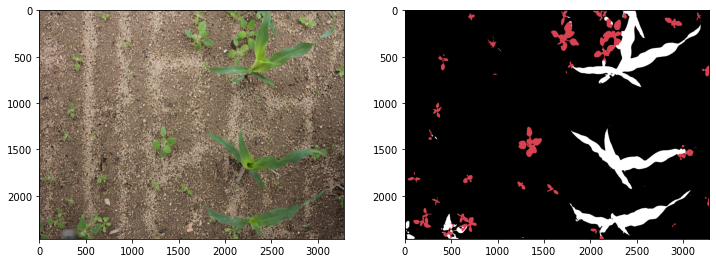

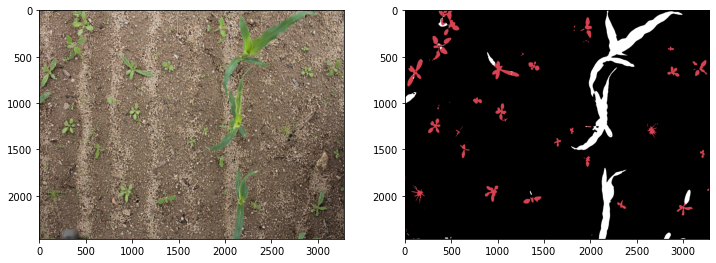

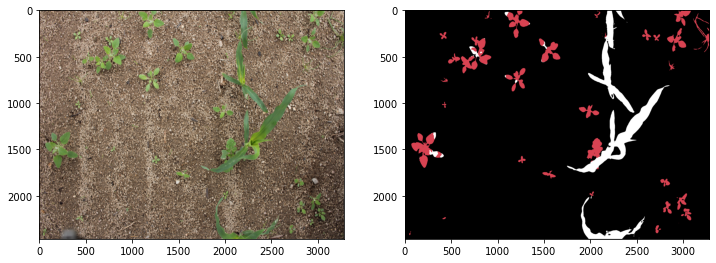

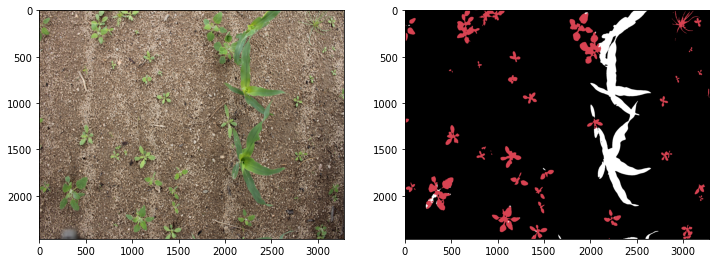

...

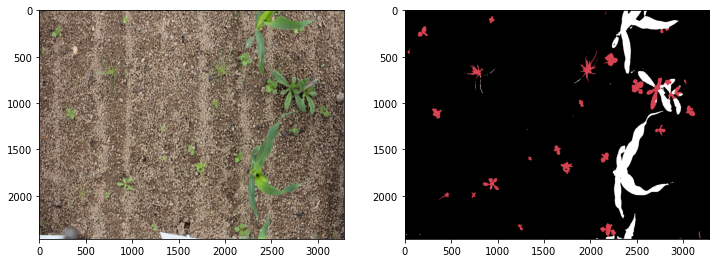

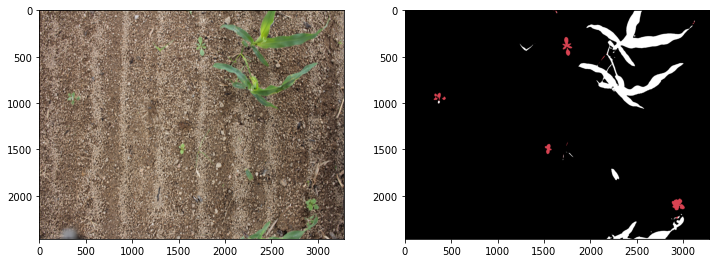

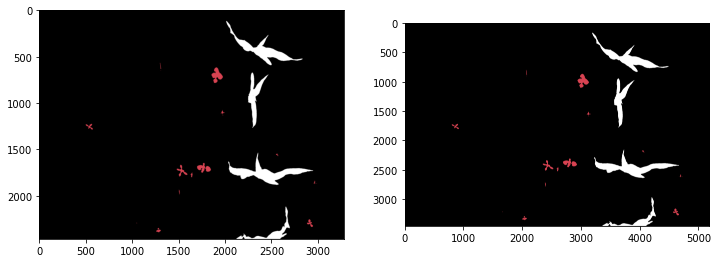

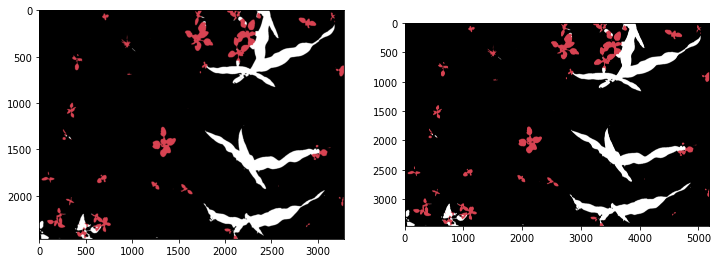

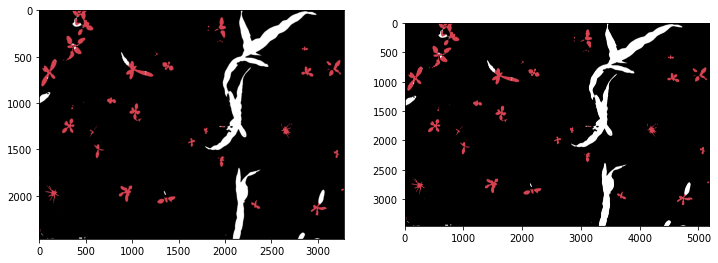


--------------------------------------------------------------------------------------------------
END TRAINING OF WEEDELEC MAIS
--------------------------------------------------------------------------------------------------

Encoding Completato
File salvato come submission_Dec28_01-09-42.json


In [ ]:
info = initialize_info()
submission_dict = create_subdict(info["data_dir"])
#submission_dict = train(info, submission_dict, "roseau", "haricot", 150, True)
submission_dict = train(info, submission_dict, "weedelec", "mais", 150, True)
create_json(submission_dict)

# Results


The results we have obtained were largely satisfying, as we can see in the leaderboard , but we have faced problems with the Roseau dataset because of the poor quality of its images. In this dataset our goal was not completely reached, but the results of the other three datasets told us that this approach was successful to face the most part of the challenge. 


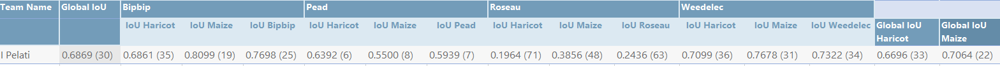

Link to the competition on CodaLab -> https://competitions.codalab.org/competitions/27176#learn_the_details-overview